## Assignment 01

#### 1. Implement the intensity transformation depicted in Fig. 1a on the image shown in Fig. 1b

51
100
105
256


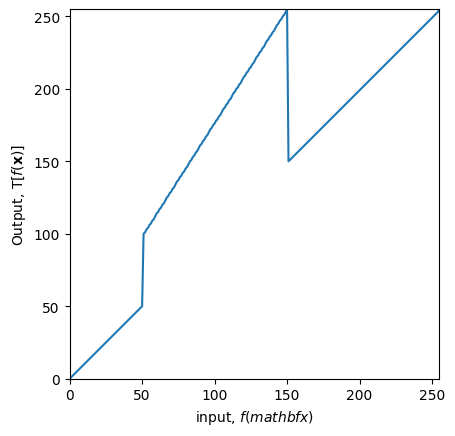

(810, 720)


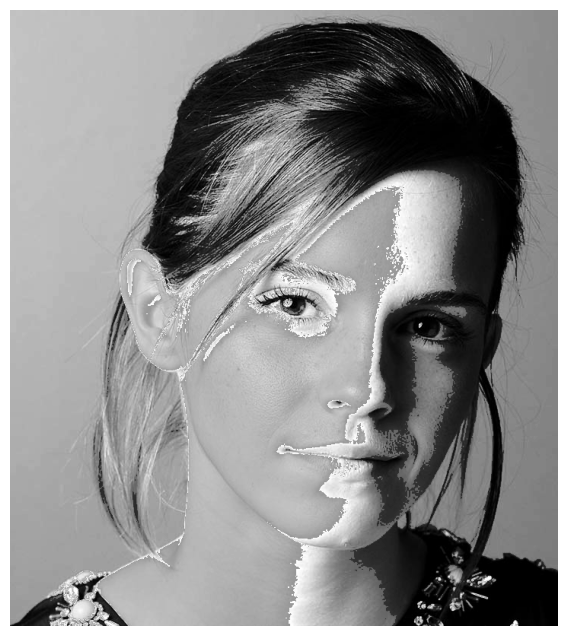

In [159]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

#create an 2D array using this items 
c=np.array([(100,50),(150,200)]) 

#create t1 0-50 and map into 0-100 values
t1 = np.linspace(0,50,50+1-0).astype('uint8')
print(len(t1))

#create t2 51-200 and map from 100-150 values
t2 = np.linspace(100,255, 100).astype('uint8')
print(len(t2))

#create t2 200-255 and map from 151-255 values
t3 = np.linspace(150,255, 105).astype('uint8')
print(len(t3))

#covert them into a single array
transform = np.concatenate((t1,t2),axis=0).astype('uint8')
transform = np.concatenate((transform,t3),axis=0).astype('uint8')
print(len(transform))

#create a figure plot
fig , ax = plt.subplots()
ax.plot(transform)
ax.set_xlabel(r'input, $f(mathbf{x})$')
ax.set_ylabel('Output, $\mathrm{T}[f(\mathbf{x})]$')
ax.set_xlim(0,255)
ax.set_ylim(0,255)
#y axis and x axis lenght eqaual
ax.set_aspect('equal') 
#save the image
plt.savefig('transform.png')
plt.show()


img_orig = cv.imread(r'C:\Users\MSII\Documents\sem 5\image processing\Assignment 1\emma.jpg', cv.IMREAD_GRAYSCALE)
#print the shape of the image opened
print(img_orig.shape)
#this will create the window to display image and make it autosize and cannot be changed
#cv.namedWindow('image', cv.WINDOW_AUTOSIZE)
custom_window_size = (1024, 1820)  # Change the dimensions as needed
cv.namedWindow('image', cv.WINDOW_NORMAL)
cv.resizeWindow('image', custom_window_size)
cv.imshow('image',img_orig)
cv.waitKey(0)

#this will transform the image using above created LUT
image_transformed = cv.LUT(img_orig,transform)
cv.imshow('image',image_transformed)
cv.waitKey(0)
cv.destroyAllWindows()
fig , ax = plt.subplots(1,1,figsize=(8,8))
ax.imshow(image_transformed,cmap="gray")
ax.axis('off')
plt.show()

#### 2. Apply a similar operation as above (question 1) to accentuate

(a) white matter

(b) gray matter

in the brain proton density image shown in Fig. 2. Show the intensity transformations as a plots

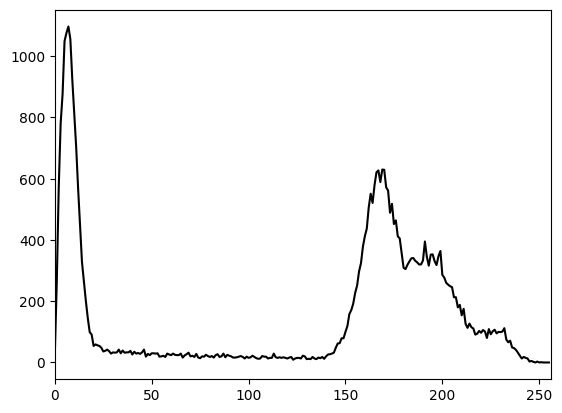

In [122]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread(r'C:\Users\MSII\Documents\sem 5\image processing\Assignment 1\BrainProtonDensitySlice9.png', cv.IMREAD_GRAYSCALE)

#1st argument is list of images, here only one image
#2nd argument is [0] the channel we want to calculate hsitogram here only grayscale
#3rd argument is applied mask, no mask applied
#4th argument is number of bins, here 256 bins applied
#5th argument specifies the range of values for the bins
hist= cv.calcHist([img],[0],None,[256],[0,256])

plt.plot(hist,color='black')
plt.xlim([0,256])
plt.show()

##### **Accenuate white & gray matter** 

gray matter (180,255)

white matter (150,180)

256


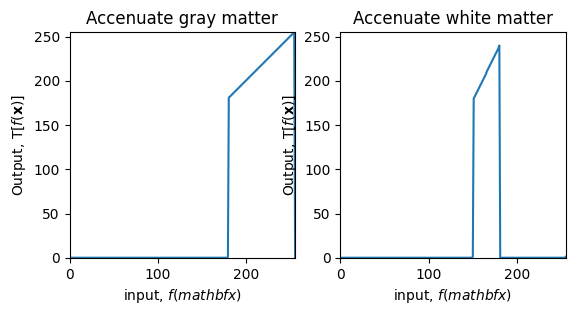

(217, 181)


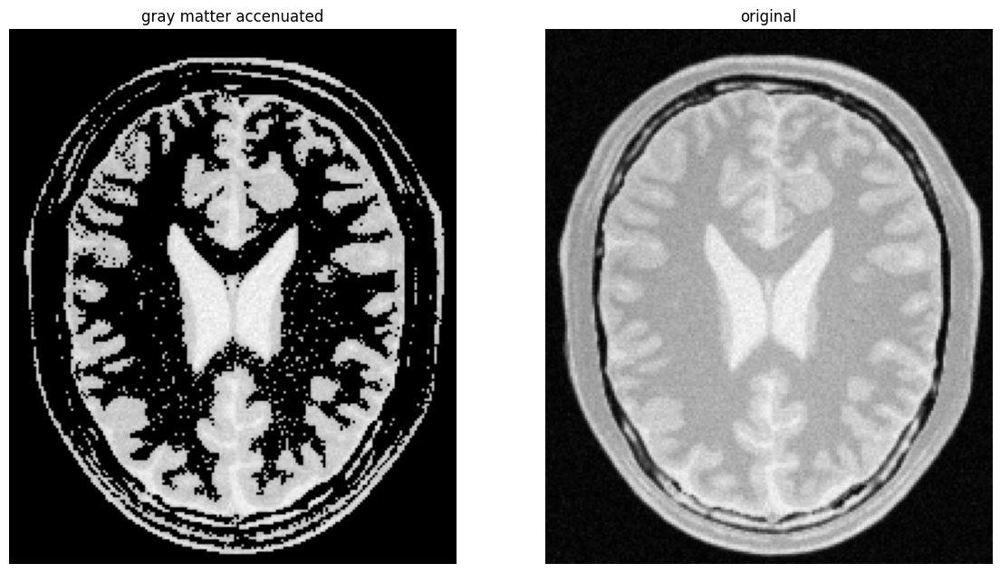

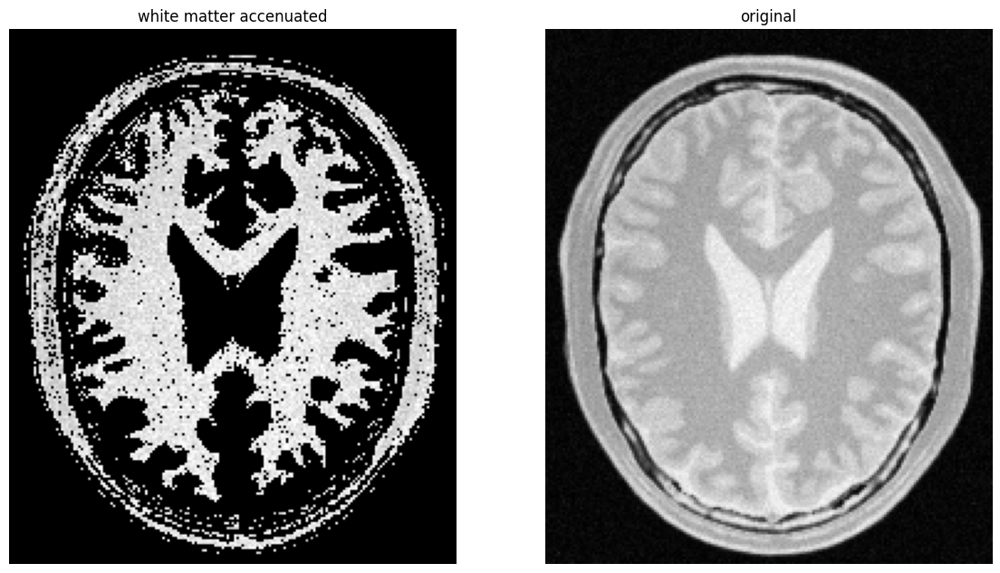

In [156]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

#gray matter filter
t1 = np.linspace(0,1,180).astype('uint8')
t2 = np.linspace(181,255, 255-180).astype('uint8')
t3 = np.linspace(0,1, 256-255).astype('uint8')

#white matter filter
b1 = np.linspace(0,1,151).astype('uint8')
b2 =np.linspace(180,240,181-151).astype('uint8')
b3 = np.linspace(0,1,256-181).astype('uint8')

#covert them into a single array
gray_transform = np.concatenate((t1,t2),axis=0).astype('uint8')
gray_transform = np.concatenate((gray_transform,t3),axis=0).astype('uint8')
#transform = np.concatenate((white_transform,t3),axis=0).astype('uint8')
print(len(gray_transform))

white_transform = np.concatenate((b1,b2),axis=0).astype('uint8')
white_transform = np.concatenate((white_transform,b3),axis=0).astype('uint8')

#create a figure plot
fig , ax = plt.subplots(1,2)
ax[0].plot(gray_transform)
ax[0].set_title('Accenuate gray matter')
ax[0].set_xlabel(r'input, $f(mathbf{x})$')
ax[0].set_ylabel('Output, $\mathrm{T}[f(\mathbf{x})]$')
ax[0].set_xlim(0,255)
ax[0].set_ylim(0,255)
#y axis and x axis lenght eqaual
ax[0].set_aspect('equal') 
#save the image
#plt.savefig('white matte transform.png')

ax[1].plot(white_transform)
ax[1].set_title('Accenuate white matter')
ax[1].set_xlabel(r'input, $f(mathbf{x})$')
ax[1].set_ylabel('Output, $\mathrm{T}[f(\mathbf{x})]$')
ax[1].set_xlim(0,255)
ax[1].set_ylim(0,255)
#y axis and x axis lenght eqaual
ax[1].set_aspect('equal')
plt.show()


img_orig = cv.imread(r'C:\Users\MSII\Documents\sem 5\image processing\Assignment 1\BrainProtonDensitySlice9.png', cv.IMREAD_GRAYSCALE)
#print the shape of the image opened
print(img_orig.shape)
#this will create the window to display image and make it autosize and cannot be changed
#cv.namedWindow('image', cv.WINDOW_AUTOSIZE)
custom_window_size = (1024, 1820)  # Change the dimensions as needed
cv.namedWindow('image', cv.WINDOW_NORMAL)
cv.resizeWindow('image', custom_window_size)
cv.imshow('image',img_orig)
cv.waitKey(0)

#this will transform the image using above created LUT
image_transformed_gray = cv.LUT(img_orig,gray_transform)
cv.imshow('image',image_transformed_gray)
cv.waitKey(0)

fig , ax = plt.subplots(1,2,figsize=(14,14))
ax[0].imshow(image_transformed_gray, cmap="gray")
ax[0].set_title('gray matter accenuated')
ax[0].set_aspect('equal')
ax[0].axis('off')
ax[1].imshow(img_orig, cmap="gray")
ax[1].set_title('original')
ax[1].set_aspect('equal')
ax[1].axis('off')
#plt.savefig('transformed.png')
plt.show()

image_transformed_white = cv.LUT(img_orig,white_transform)
cv.imshow('image',image_transformed_white)
cv.waitKey(0)
cv.destroyAllWindows()

fig , ax = plt.subplots(1,2,figsize=(14,14))
ax[0].imshow(image_transformed_white, cmap="gray")
ax[0].set_title('white matter accenuated')
ax[0].set_aspect('equal')
ax[0].axis('off')
ax[1].imshow(img_orig, cmap="gray")
ax[1].set_title('original')
ax[1].set_aspect('equal')
ax[1].axis('off')
#plt.savefig('transformed.png')
plt.show()

#### 3 gamma corrrection
(a) Apply gamma correction to the L plane in the L∗a∗b∗ color space and state the γ value.
(b) Show the histograms of the original and corrected images

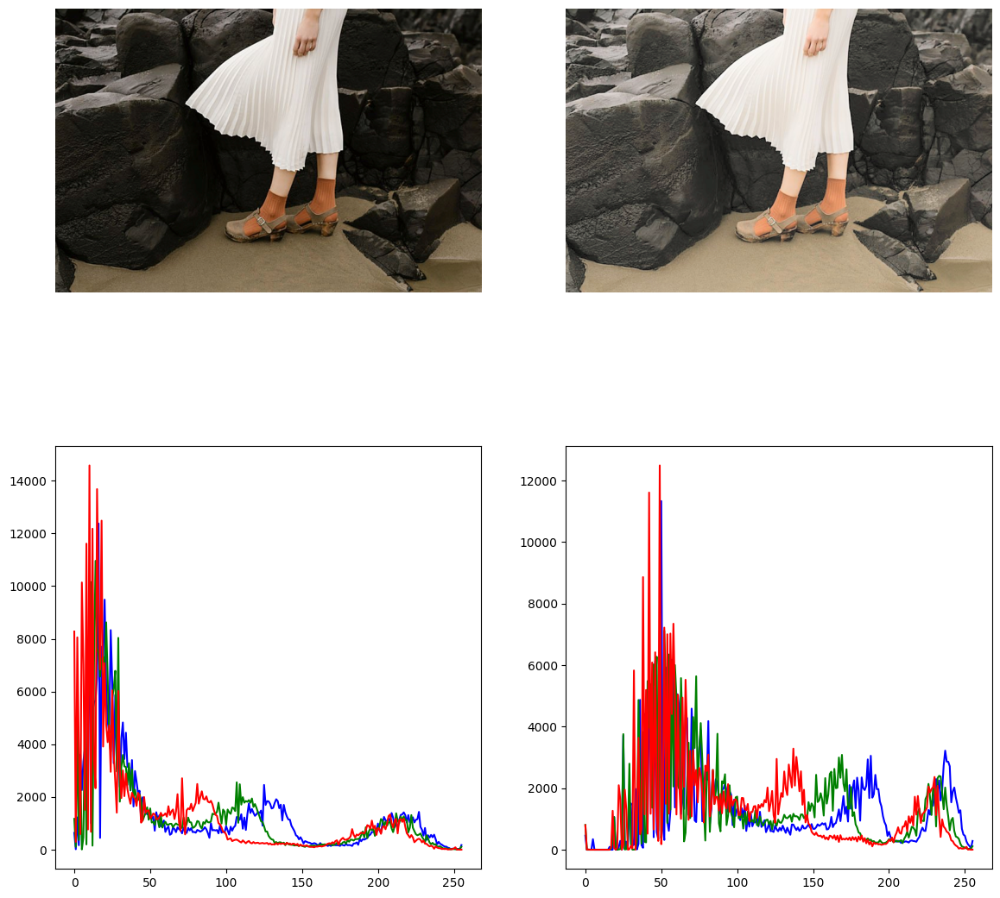

In [154]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
img_orig = cv.imread(r'C:\Users\MSII\Documents\sem 5\image processing\Assignment 1\highlights_and_shadows.jpg',cv.IMREAD_COLOR)
img_orig = cv.cvtColor(img_orig,cv.COLOR_BGR2Lab)
l,a,b = cv.split(img_orig)
gamma  =0.5
table = np.array([(i/255.0)**(gamma)*255.0 for i in np.arange(0,256)]).astype('uint8')
img_gamma= cv.LUT(l,table)
img_trans = cv.merge((img_gamma, a,b))
img_orig = cv.cvtColor(img_orig,cv.COLOR_Lab2RGB)
img_trans= cv.cvtColor(img_trans,cv.COLOR_Lab2RGB)

f, axarr = plt.subplots(2,2,figsize=(14,14))
axarr[0,0].imshow(img_orig)
axarr[0,0].axis('off')
axarr[0,1].imshow(img_trans)
axarr[0,1].axis('off')
color=('b','g','r')

for i,c in enumerate(color):
    hist_orig = cv.calcHist([img_orig],[i],None, [256],[0,256])
    axarr[1,0].plot(hist_orig,color=c)
    hist_gamma = cv.calcHist([img_trans],[i],None, [256],[0,256])
    axarr[1,1].plot(hist_gamma,color=c)


### gamma  =0.9

#### 4. Increasing the vibrance of a photograph is probably achieved by applying an intensity transformation

In [125]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

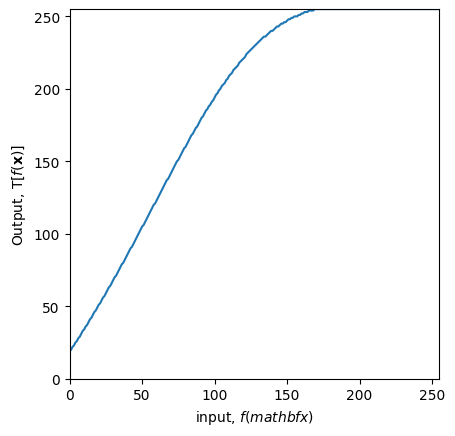

In [126]:
def vib_enhance(x,a,sigma):
    y = x+ (a*128)*np.exp((-1*((x-128)**2))/(2*(sigma**2)))
    #print("x is",x,"y is ",y)
    if y>255:
        y = 255
    return y

table2 = np.array([vib_enhance(i,0.8,70) for i in np.arange(0,256)]).astype('uint8')
#print(table)
#transform = np.arange(0,256).astype('uint8')
fig, ax = plt.subplots()
ax.plot(table2)
ax.set_xlabel(r'input, $f(mathbf{x})$')
ax.set_ylabel('Output, $\mathrm{T}[f(\mathbf{x})]$')
ax.set_xlim(0,255)
ax.set_ylim(0,255)
ax.set_aspect('equal')
plt.savefig('transform.png')
plt.show()

(-0.5, 779.5, 437.5, -0.5)

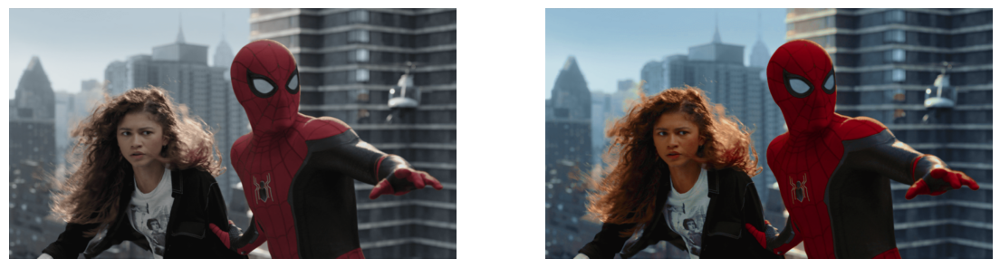

In [150]:
img_orig = cv.imread(r'C:\Users\MSII\Documents\sem 5\image processing\Assignment 1\spider.png', cv.IMREAD_COLOR)

cv.namedWindow('image', cv.WINDOW_AUTOSIZE)
# img_orig = cv.cvtColor(img_orig,cv.COLOR_BGR2RGB)
cv.imshow('image',img_orig)
cv.waitKey(0)

img_orig_HSV = cv.cvtColor(img_orig, cv.COLOR_BGR2HSV)
h,s,v = cv.split(img_orig_HSV)

s = cv.LUT(s,table2)
img_trans = cv.merge((h,s,v))
#img_orig = cv.cvtColor(img_orig,cv.COLOR_HSV2RGB)
img_trans= cv.cvtColor(img_trans,cv.COLOR_HSV2BGR)
cv.imshow('image',img_trans)
cv.waitKey(0)
cv.destroyAllWindows()

f, axarr = plt.subplots(1,2,figsize=(14,14))
axarr[0].imshow(cv.cvtColor(img_orig,cv.COLOR_BGR2RGB))
axarr[0].axis('off')
axarr[1].imshow(cv.cvtColor(img_trans,cv.COLOR_BGR2RGB))
axarr[1].axis('off')

value of a is **0.8**

##### (5) Write a function of your own to carry out histogram equalization on the image shown in Fig. 5. Show the histograms before and after equalization.

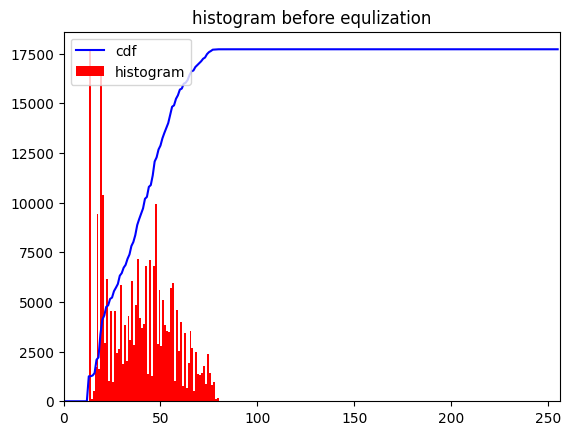

In [128]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
img = cv.imread(r'C:\Users\MSII\Documents\sem 5\image processing\Assignment 1\shells.tif',cv.IMREAD_GRAYSCALE)

#takes the hsitogram, (img.ravel()), the number of bins (256 in this case), 
# It returns the histogram values (hist) and the bin edges (bins).
hist,bins = np.histogram(img.ravel(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf*hist.max()/cdf.max()
plt.plot(cdf_normalized,color='b')
# plt.plot(hist_normalized,color='r')
plt.hist(img.flatten(),256,[0,256],color='r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'),loc = 'upper left')
plt.title('histogram before equlization')
plt.show()

In [129]:
def equalize(image):
    hist ,bins = np.histogram(image.ravel(),256,[0,256])
    print(len(hist))
    hist_norm = hist/(hist.cumsum()).max()
    for i in range(1,len(hist)):
        hist_norm[i]=hist_norm[i]+hist_norm[i-1]
    hist_norm = ((hist_norm)*255).astype(np.uint8)
    return cv.LUT(image,hist_norm)

In [130]:
def equalize2(image):
    hist ,_ = np.histogram(image.ravel(),256,[0,256])
    print(len(hist))
    hist_norm = hist/(hist.sum())
    hist_norm_cum = hist_norm.cumsum()
    hist_eq = (hist_norm_cum*255).astype(np.uint8)
    return cv.LUT(image,hist_eq)

256


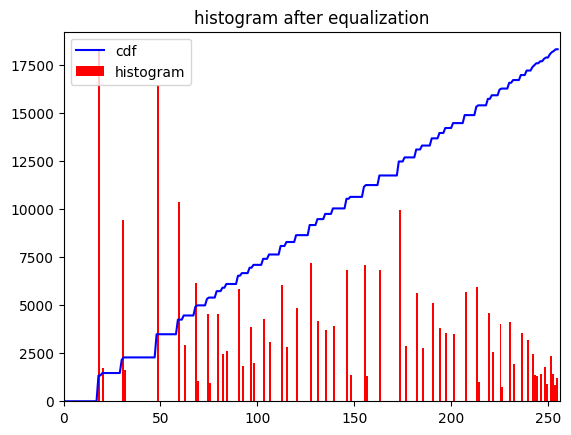

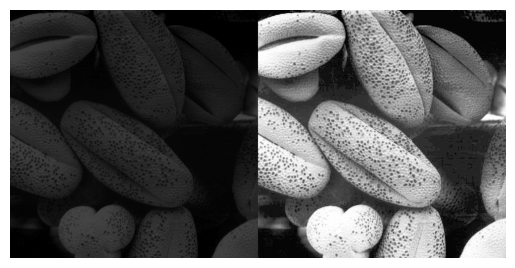

In [131]:
#This line applies histogram equalization to the original image using OpenCV's equalizeHist function. The result is stored in the equ variable.
# img_eqed=cv.equalizeHist(img)
img_eqed= equalize(img)
hist ,_ = np.histogram(img_eqed.ravel(),256,[0,256])
cdf= hist.cumsum()
cdf_normalized = cdf*hist.max()/cdf.max()
plt.plot(cdf_normalized,color='b')
plt.hist(img_eqed.flatten(),256,[0,256],color='r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'),loc = 'upper left')
plt.title('histogram after equalization')
plt.show()

res = np.hstack((img,img_eqed))
plt.axis('off')
plt.imshow(res,cmap='gray')

# print(img_eqed)
custom_window_size = (1024, 1820)  # Change the dimensions as needed
cv.namedWindow('image', cv.WINDOW_NORMAL)
cv.resizeWindow('image', custom_window_size)
cv.imshow('image',img_eqed)
cv.waitKey(0)
cv.imshow('image',img)
cv.waitKey(0)
cv.destroyAllWindows()

#### (6). In this question, we will apply histogram equalization only to the foreground of an image to produce an image with a histogram equalized foreground.

(-0.5, 3839.5, 2159.5, -0.5)

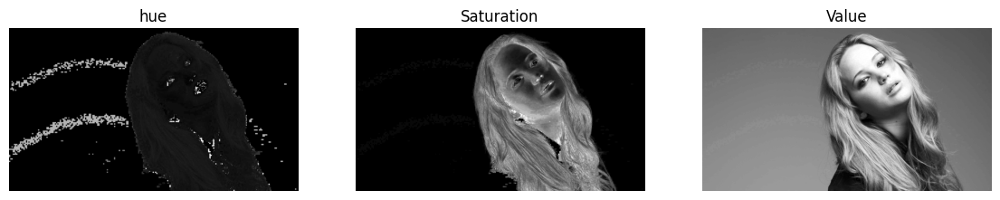

In [146]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
img = cv.imread(r'C:\Users\MSII\Documents\sem 5\image processing\Assignment 1\jeniffer.jpg',cv.IMREAD_COLOR)

img_HSV = cv.cvtColor(img, cv.COLOR_BGR2HSV)
h,s,v = cv.split(img_HSV)

f,ax = plt.subplots(1,3,figsize=(14, 14))
ax[0].imshow(h,cmap='gray')
ax[0].set_title('hue')
ax[0].axis('off')
ax[1].imshow(s,cmap='gray')
ax[1].set_title('Saturation')
ax[1].axis('off')
ax[2].imshow(v,cmap='gray')
ax[2].set_title('Value')
plt.axis('off')

(b) Selected foreground is saturation plane

(-0.5, 3839.5, 2159.5, -0.5)

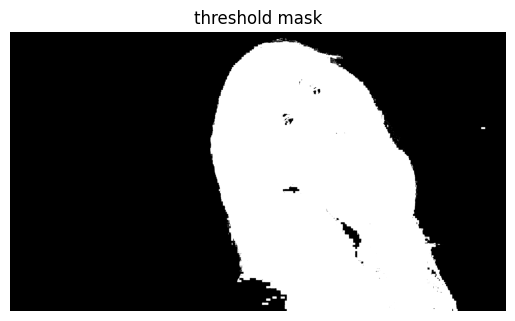

In [147]:
_, thresholded_mask = cv.threshold(s, 12, 255, cv.THRESH_BINARY)
f,ax = plt.subplots(1,1)
ax.imshow(thresholded_mask,cmap='gray')
ax.set_title('threshold mask')
plt.axis('off')

(c) Now obtain the foreground only using cv.bitwise_and and compute the histogram

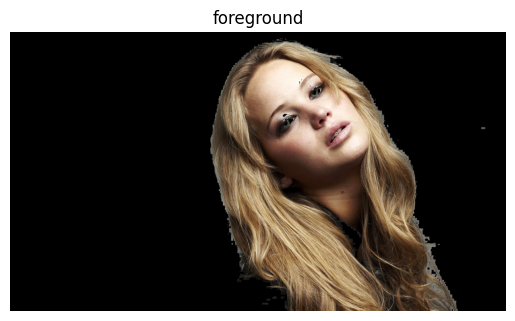

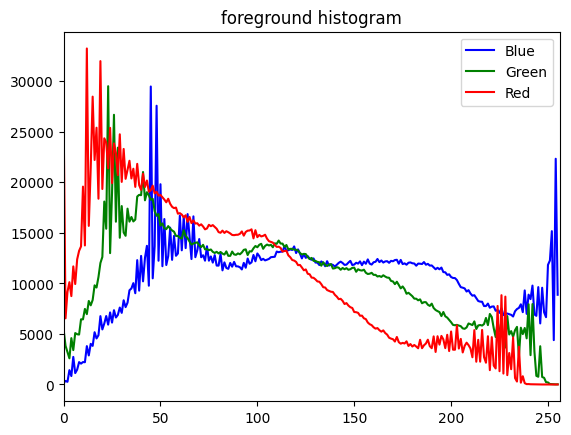

In [134]:
foreground = cv.bitwise_and(img,img, mask=thresholded_mask)
#f,ax = plt.subplots(2,1)
foreground=cv.cvtColor(foreground,cv.COLOR_BGR2RGB)
plt.imshow(foreground)
plt.title('foreground')
plt.axis("off")
plt.show()

color = ('b','g','r')
for i,c in enumerate(color):
    foreground_hist = cv.calcHist([foreground], [i], thresholded_mask, [256], [0, 256])
    plt.plot(foreground_hist, color=c)
    plt.xlim([0,256])
    plt.title('foreground histogram')
    plt.legend(["Blue", "Green", "Red"])
plt.show()


(d) Obtain the cumulative sum of the histogram using np.cumsum

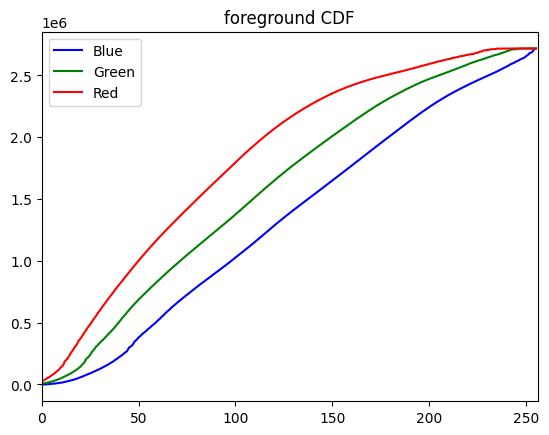

In [135]:
# hist_foreground ,_ = np.histogram(foreground.ravel(),256,[0,256])
# cum_foreground = np.cumsum(hist_foreground)
# cdf_normalized = cum_foreground*hist_foreground.max()/cum_foreground.max()
# plt.plot(cdf_normalized,color='b')
# plt.xlim([0,256])
# plt.title('CDF')
# plt.show()

color = ('b','g','r')
for i,c in enumerate(color):
    foreground_hist = cv.calcHist([foreground], [i], thresholded_mask, [256], [0, 256])
    cum_foreground = np.cumsum(foreground_hist)
    plt.plot(cum_foreground, color=c)
    plt.xlim([0,256])
    plt.title('foreground CDF')
    plt.legend(["Blue", "Green", "Red"])
plt.show()

(e) Use the formulas in slides to histogram-equalize the foreground

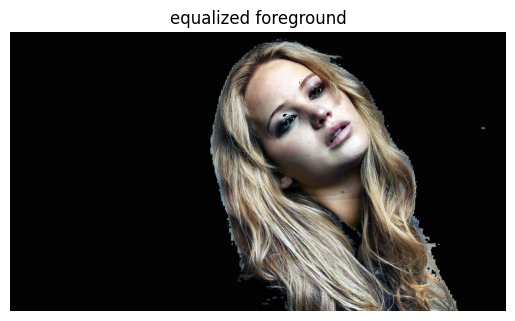

In [136]:
clahe = cv.createCLAHE(clipLimit=2.0,tileGridSize=(8,8))
r,g,b= cv.split(foreground)
r_new=clahe.apply(r)
g_new=clahe.apply(g)
b_new=clahe.apply(b)
foreground_eq1 = cv.merge((r_new,g_new,b_new))

r2 = cv.equalizeHist(r)
g2 = cv.equalizeHist(g)
b2 = cv.equalizeHist(b)
foreground_eq2 = cv.merge((r2,g2,b2))


# foreground_eq = cv.equalizeHist(foreground)
# cum_foreground_eq = np.cumsum(foreground_eq)
# cdf_normalized_eq = cum_foreground_eq*foreground_eq.max()/cum_foreground_eq.max()
# plt.plot(cdf_normalized_eq,color='b')
# plt.xlim([0,256])
# plt.title('CDF')
# plt.show()
plt.imshow(foreground_eq1)
plt.title('equalized foreground')
plt.axis("off")
plt.show()


(f) Extract the background and add with the histogram equalized foreground

(-0.5, 3839.5, 2159.5, -0.5)

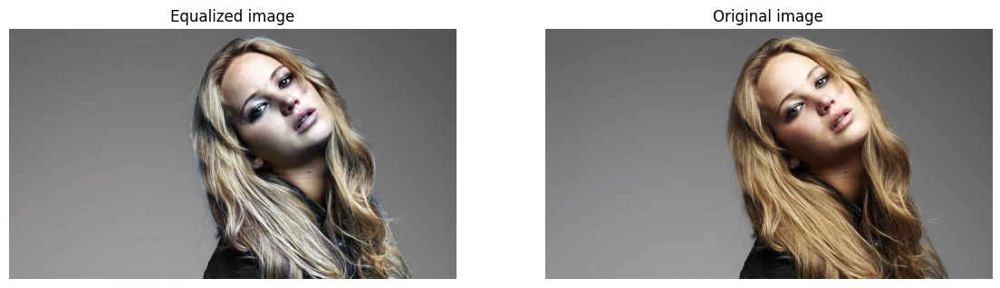

In [149]:
bg = cv.bitwise_and(img, img, mask=cv.bitwise_not(thresholded_mask))
final_img = cv.add(foreground_eq1, bg)

f, ax = plt.subplots(1,2,figsize=(14, 14))
ax[0].imshow(final_img)
ax[0].set_title('Equalized image')
ax[0].axis('off')
ax[1].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
ax[1].set_title('Original image')
plt.axis('off')

#### (7). Filtering with the Sobel operator can compute the gradient

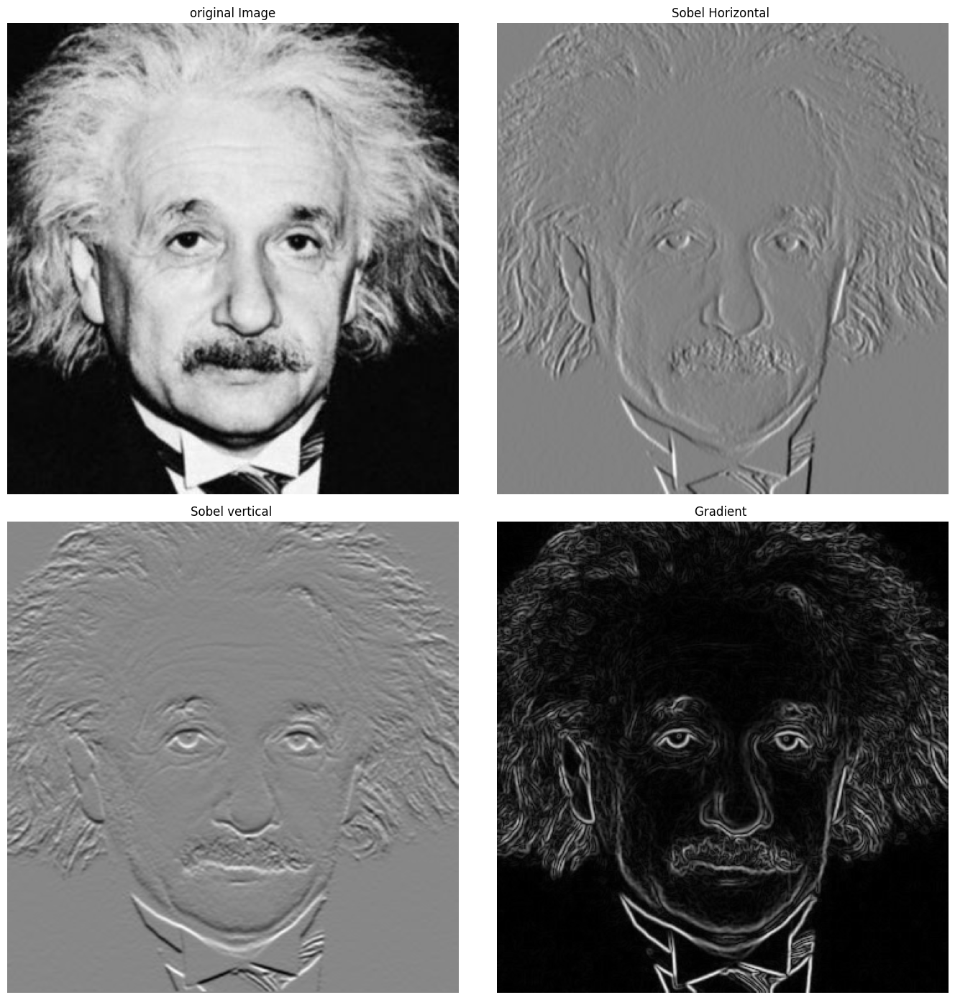

In [138]:
#Sobel filter using filter2D function

import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img_orig = cv.imread(r"C:\Users\MSII\Documents\sem 5\image processing\Assignment 1\einstein.png", cv.IMREAD_GRAYSCALE)
sobel_x = cv.filter2D(img_orig, cv.CV_64F, np.array([[-1,0,1], [-2,0,2], [-1,0,1]]))
sobel_y = cv.filter2D(img_orig, cv.CV_64F, np.array([[-1,-2,-1], [0,0,0], [1,2,1]]))
grad = np.sqrt(sobel_x**2 + sobel_y**2)

f, ax = plt.subplots(2,2,figsize=(14, 14))
ax[0][0].imshow(img_orig,cmap='gray')
ax[0][0].set_title('original Image')
ax[0][0].axis('off')
ax[0][1].imshow(sobel_x,cmap='gray')
ax[0][1].set_title('Sobel Horizontal ')
ax[0][1].axis('off')
ax[1][0].imshow(sobel_y,cmap='gray')
ax[1][0].set_title('Sobel vertical ')
ax[1][0].axis('off')
ax[1][1].imshow(grad,cmap='gray')
ax[1][1].set_title('Gradient ')
plt.axis('off')
plt.tight_layout()
plt.show()


(b) Write your own code to Sobel filter the image

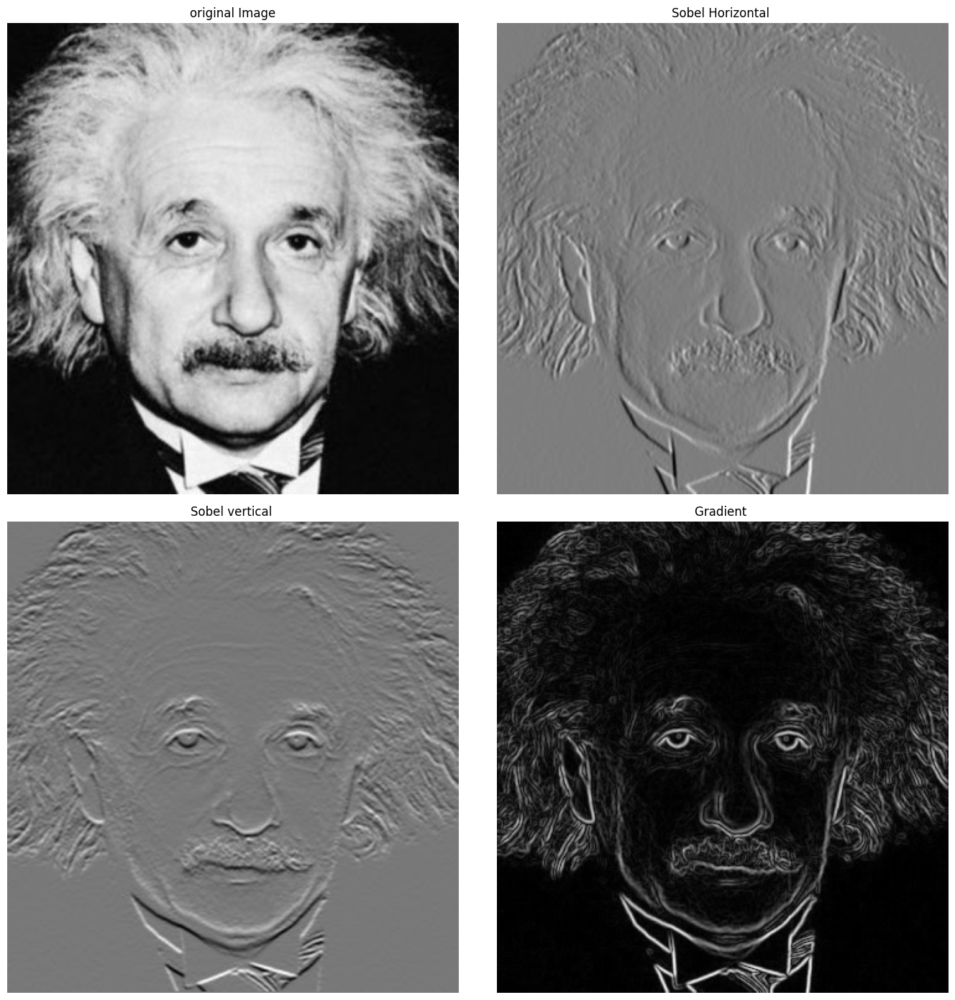

In [139]:
sobel_x_y = np.array([[1], [2], [1]], dtype='float')
sobel_x_x = np.array([[1, 0, -1]], dtype='float')

img_x = cv.filter2D(img_orig, cv.CV_64F, sobel_x_y)
sobel_x = cv.filter2D(img_x, cv.CV_64F, sobel_x_x)

sobel_y_y = np.array([[1], [0], [-1]], dtype='float')
sobel_y_x = np.array([[1, 2, 1]], dtype='float')

img_y = cv.filter2D(img_orig, cv.CV_64F, sobel_y_y)
sobel_y = cv.filter2D(img_y, cv.CV_64F, sobel_y_x)

# Compute the gradient magnitude
grad = np.sqrt(sobel_x**2 + sobel_y**2)

f, ax = plt.subplots(2,2,figsize=(14, 14))
ax[0][0].imshow(img_orig,cmap='gray')
ax[0][0].set_title('original Image')
ax[0][0].axis('off')
ax[0][1].imshow(sobel_x,cmap='gray')
ax[0][1].set_title('Sobel Horizontal ')
ax[0][1].axis('off')
ax[1][0].imshow(sobel_y,cmap='gray')
ax[1][0].set_title('Sobel vertical ')
ax[1][0].axis('off')
ax[1][1].imshow(grad,cmap='gray')
ax[1][1].set_title('Gradient ')
plt.axis('off')
plt.tight_layout()
plt.show()


#### 8. Write a program to zoom images by a given factor s ∈ (0,10].

(a) nearest-neighbor

In [160]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

def zoom_NNI(img,zoom_factor):
    new_img = np.zeros((img.shape[0]*zoom_factor, img.shape[1]*zoom_factor, img.shape[2]), dtype=np.uint8)
    height= img.shape[0]*zoom_factor
    width = img.shape[1]*zoom_factor
    for i in range(height):
        for j in range(width):
            new_img[i,j] = img[int(i/zoom_factor),int(j/zoom_factor)]
    return new_img

(b) bilinear interpolation

In [161]:
def zoom_BLI(img,zoom_factor):
    new_img = np.zeros((img.shape[0]*zoom_factor, img.shape[1]*zoom_factor, img.shape[2]), dtype=np.uint8)
    height= img.shape[0]*zoom_factor
    width = img.shape[1]*zoom_factor
    for i in range(height):
        for j in range(width):
            x = int(i/zoom_factor)
            y = int(j/zoom_factor)
            a = i/zoom_factor - x
            b = j/zoom_factor - y
            if x == img.shape[0]-1 or y == img.shape[1]-1:
                new_img[i,j] = img[x,y]
            else:
                new_img[i,j] = (1-a)*(1-b)*img[x,y] + (1-a)*b*img[x,y+1] + a*(1-b)*img[x+1,y] + a*b*img[x+1,y+1]
    return new_img


4
NNI:  (1080, 1920, 3)
BLI:  (1080, 1920, 3)


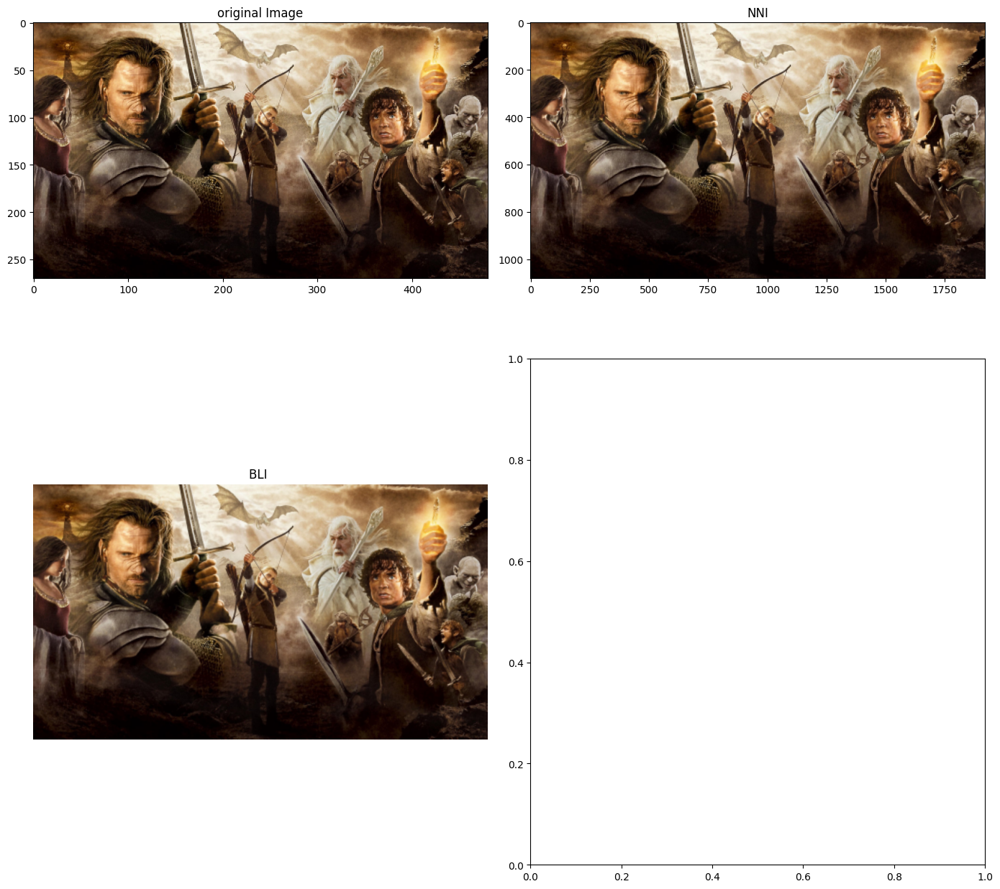

SSD (Nearest Neighbour Interpolation):  93.85294945987654
SSD (Bilinear Interpolation):  117.721953125


In [162]:
img = cv.imread(r"zooming\zooming\im01small.png", cv.IMREAD_COLOR)
img_zoomed = cv.imread(r"zooming\zooming\im01.png", cv.IMREAD_COLOR)

zoom_factor = round(img_zoomed.shape[0]/img.shape[0])
print(zoom_factor)
new_img_size = (img.shape[0] * zoom_factor, img.shape[1] * zoom_factor, img.shape[2])

nni_zoomed = zoom_NNI(img,zoom_factor)
bli_zoomed = zoom_BLI(img,zoom_factor)

print("NNI: ", nni_zoomed.shape)
print("BLI: ", bli_zoomed.shape)

f, ax = plt.subplots(2,2,figsize=(14, 14))
ax[0][0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
ax[0][0].set_title('original Image')
# ax[0][0].axis('off')
ax[0][1].imshow(cv.cvtColor(nni_zoomed, cv.COLOR_BGR2RGB))
ax[0][1].set_title('NNI')
# ax[0][1].axis('off')
ax[1][0].imshow(cv.cvtColor(bli_zoomed, cv.COLOR_BGR2RGB))
ax[1][0].set_title('BLI ')
ax[1][0].axis('off')
# plt.axis('off')
plt.tight_layout()
plt.show()

# compute the normalized sum of squared difference (SSD) between the original and zoomed images
ssd_nni = np.sum((img_zoomed - nni_zoomed)**2) / (img_zoomed.shape[0] * img_zoomed.shape[1])
ssd_bli = np.sum((img_zoomed - bli_zoomed)**2) / (img_zoomed.shape[0] * img_zoomed.shape[1])

print("SSD (Nearest Neighbour Interpolation): ", ssd_nni)
print("SSD (Bilinear Interpolation): ", ssd_bli)


#### (9) 
(a) Use grabCut to segment the image. Show the final segmentation mask, foreground image, and
background image

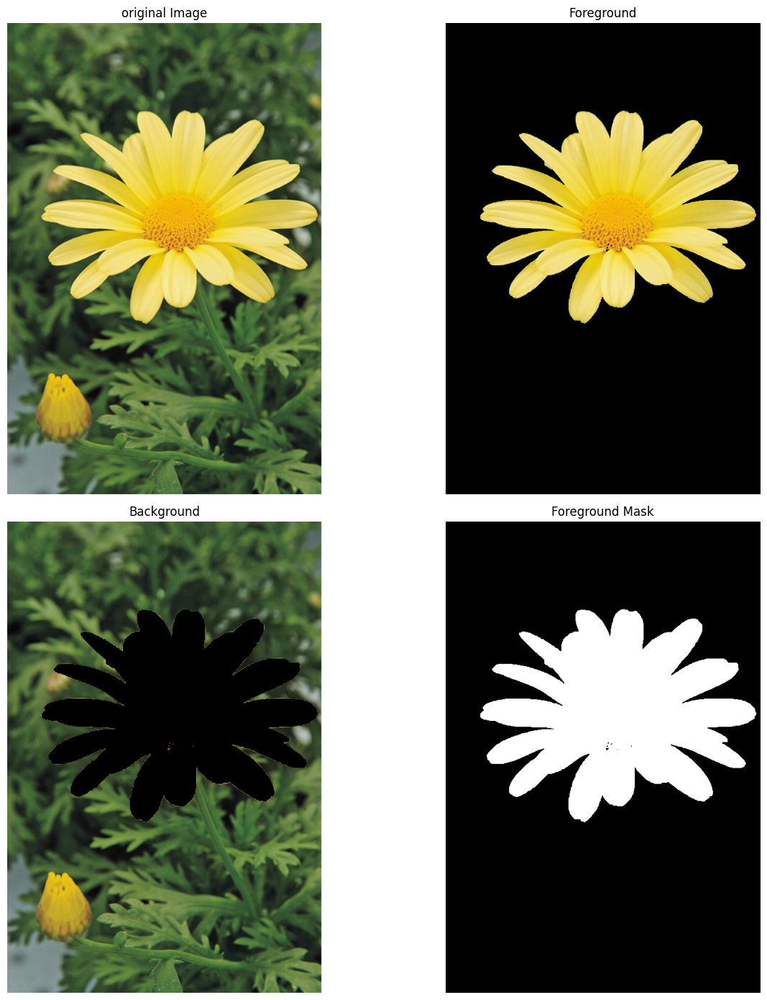

In [170]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread(r"C:\Users\MSII\Documents\sem 5\image processing\Assignment 1\flower.png", cv.IMREAD_COLOR)

mask = np.zeros(img.shape[:2], np.uint8)
bg = np.zeros((1,65), np.float64)
fg = np.zeros((1,65), np.float64)
rect = (50, 100, 500, 450)
# rect = (30, 30, img.shape[1] - 30, img.shape[0] - 150)

cv.grabCut(img, mask, rect, bg, fg, 9, cv.GC_INIT_WITH_RECT)
mask2 = np.where((mask==2)|(mask==0), 0, 1).astype('uint8')

# Segment the foreground and background
foreground = img * mask2[:,:,np.newaxis]
background = img - foreground

f, ax = plt.subplots(2,2,figsize=(14, 14))
ax[0][0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
ax[0][0].set_title('original Image')
ax[0][0].axis('off')
ax[0][1].imshow(cv.cvtColor(foreground, cv.COLOR_BGR2RGB))
ax[0][1].set_title('Foreground')
ax[0][1].axis('off')
ax[1][0].imshow(cv.cvtColor(background, cv.COLOR_BGR2RGB))
ax[1][0].set_title('Background')
ax[1][0].axis('off')
ax[1][0].axis('off')
ax[1][1].imshow(mask2,cmap='gray')
ax[1][1].set_title('Foreground Mask')
ax[1][1].axis('off')
ax[1][1].axis('off')
plt.tight_layout()
plt.show()

(b) Produce an enhanced image with a substantially blurred background. Display the original image alongside the enhanced image.

(-0.5, 535.5, 801.5, -0.5)

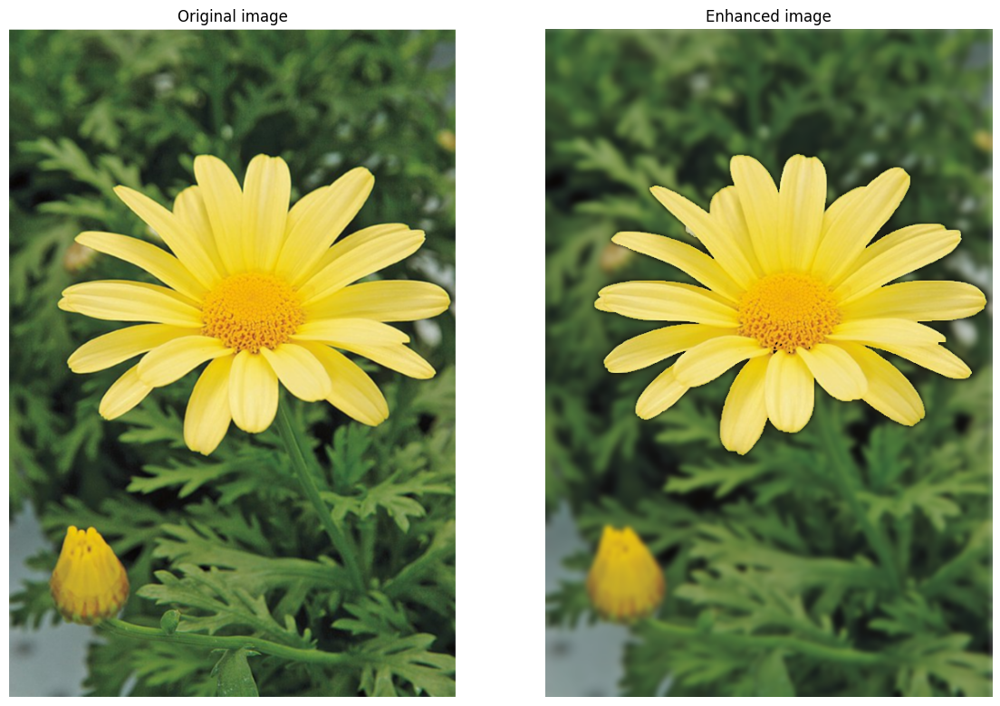

In [172]:
blur_bg = cv.GaussianBlur(background, (17, 17), 0)
# img_final = foreground + blur_bg
img_final = np.where(mask2[:, :, np.newaxis] == 1, img, blur_bg)

f, ax = plt.subplots(1,2,figsize=(14, 14))
ax[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
ax[0].set_title('Original image')
ax[0].axis('off')
ax[1].imshow(cv.cvtColor(img_final, cv.COLOR_BGR2RGB))
ax[1].set_title('Enhanced image')
plt.axis('off')